<a href="https://colab.research.google.com/github/Atma-vidya-manoj/CAPSTONE/blob/main/AllModelswithcsvfile.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!ls


sample_data


In [ ]:
from google.colab import files
files.upload()


MessageError: TypeError: Cannot read properties of undefined (reading 'next')

In [ ]:
zip_filename = '/content/data.zip'
extract_path = '/content/TACO_dataset/'

import zipfile
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall(extract_path)


In [ ]:
import os
extract_path = '/content/TACO_dataset/'

if not os.path.exists(extract_path):
    os.makedirs(extract_path)


In [ ]:
import os
import json
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Load a pre-trained model
model = tf.keras.applications.MobileNetV2(weights='imagenet')
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions


14536120/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
# Load JSON file and extract 50 image URLs
json_path = "/content/TACO_dataset/data/annotations.json"  # Update the path to your annotations file
num_images = 50

with open(json_path, "r") as f:
    annotations = json.load(f)

# Extract URLs
image_urls = []
for img in annotations["images"]:
    if "flickr_url" in img:
        image_urls.append(img["flickr_url"])
    if len(image_urls) >= num_images:
        break

print(f"Extracted {len(image_urls)} image URLs.")


Extracted 50 image URLs.


In [ ]:
# Create a directory to save images
output_dir = "taco_images"
os.makedirs(output_dir, exist_ok=True)

# Download and save images
image_paths = []
for idx, url in enumerate(image_urls):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img = img.resize((224, 224))  # Resize for model input
    img_path = os.path.join(output_dir, f"image_{idx+1}.jpg")
    img.save(img_path)
    image_paths.append(img_path)
    print(f"Saved image {idx+1}/{len(image_urls)}")

print("All images downloaded.")


Saved image 1/50
Saved image 2/50
Saved image 3/50
Saved image 4/50
Saved image 5/50
Saved image 6/50
Saved image 7/50
Saved image 8/50
Saved image 9/50
Saved image 10/50
Saved image 11/50
Saved image 12/50
Saved image 13/50
Saved image 14/50
Saved image 15/50
Saved image 16/50
Saved image 17/50
Saved image 18/50
Saved image 19/50
Saved image 20/50
Saved image 21/50
Saved image 22/50
Saved image 23/50
Saved image 24/50
Saved image 25/50
Saved image 26/50
Saved image 27/50
Saved image 28/50
Saved image 29/50
Saved image 30/50
Saved image 31/50
Saved image 32/50
Saved image 33/50
Saved image 34/50
Saved image 35/50
Saved image 36/50
Saved image 37/50
Saved image 38/50
Saved image 39/50
Saved image 40/50
Saved image 41/50
Saved image 42/50
Saved image 43/50
Saved image 44/50
Saved image 45/50
Saved image 46/50
Saved image 47/50
Saved image 48/50
Saved image 49/50
Saved image 50/50
All images downloaded.


In [ ]:
# Function to classify images
def classify_image(img_path):
    img = Image.open(img_path)
    img_array = np.array(img)
    img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)
    predictions = model.predict(img_array)
    decoded_preds = decode_predictions(predictions, top=1)[0]
    return decoded_preds[0][1]  # Return class label

# Classify all images
results = {}
for img_path in image_paths:
    class_label = classify_image(img_path)
    results[img_path] = class_label
    print(f"{img_path}: {class_label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
taco_images/image_1.jpg: beaker
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
taco_images/image_2.jpg: nail
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
taco_images/image_3.jpg: sleeping_bag
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
taco_images/image_4.jpg: hen-of-the-woods
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
taco_images/image_5.jpg: buckeye
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
taco_images/image_6.jpg: packet
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
taco_images/image_7.jpg: water_bottle
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
taco_images/image_8.jpg: binder
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
taco_images/image_9.jpg: valley
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
taco_images/image_10.jpg: moving_van
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
taco_images/image_11.jpg: hen-of-the-woods
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
taco_images/image_12.jpg: shopping_basket
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
taco_images/image_13.jpg: refri

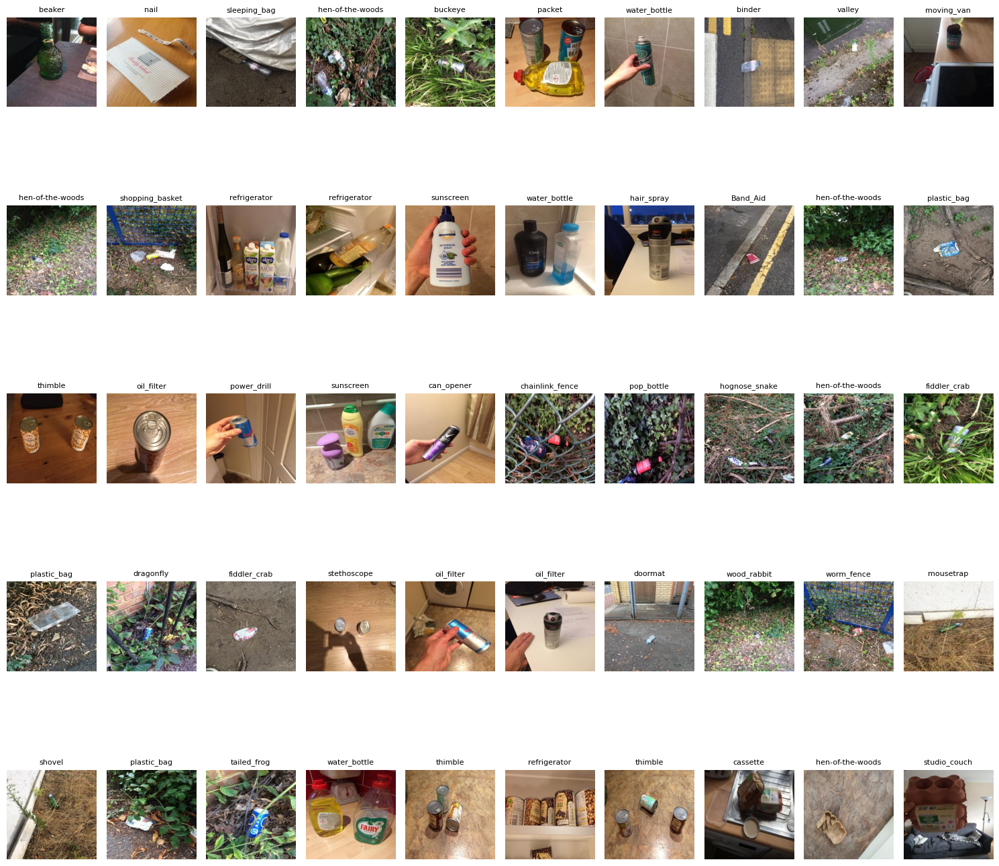

In [ ]:
# Plot classified images
plt.figure(figsize=(15, 15))
for idx, (img_path, label) in enumerate(results.items()):
    img = Image.open(img_path)
    plt.subplot(5, 10, idx+1)  # 5 rows, 10 columns
    plt.imshow(img)
    plt.title(label, fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()


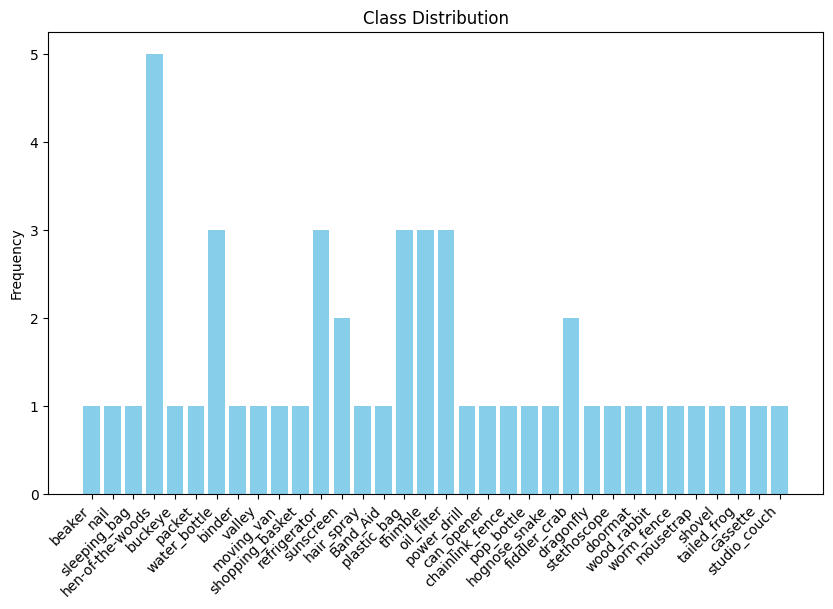

In [ ]:
from collections import Counter

# Count class occurrences
class_counts = Counter(results.values())

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.xticks(rotation=45, ha="right")
plt.title("Class Distribution")
plt.ylabel("Frequency")
plt.show()


In [ ]:
!pip install scikit-learn

from sklearn.metrics import precision_score, accuracy_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import numpy as np

# Assuming you have the true labels for the classification task
# y_true is the true labels, and y_pred contains the predictions from MobileNetV2

# True labels for the test images. Ensure these align with the actual classes predicted by your model.
y_true = ["plastic bottle", "cardboard", "plastic bag", "metal can"]

# Assuming 'results' is a dictionary mapping image paths to predicted labels
y_pred = list(results.values())  # Predictions from MobileNetV2 results

# Define a mapping from labels to numerical values
label_mapping = {
    "plastic bottle": 0,
    "cardboard": 1,
    "plastic bag": 2,
    "metal can": 3
    # Add more labels and numerical values as needed
}

# Function to convert labels to numeric values using the mapping
def label_to_numeric(label):
    return label_mapping.get(label, -1)  # Return -1 if label not found in mapping

# Filter predictions to only those with true labels in the y_true list
filtered_y_pred = [label for label in y_pred if label in y_true]

# If any true labels are missing in the predictions, add them with a default prediction (e.g., the first true label)
missing_labels = set(y_true) - set(filtered_y_pred)
filtered_y_pred.extend([y_true[0]] * len(missing_labels))  # Add missing labels with a default prediction

# Now, ensure y_true and filtered_y_pred have the same length for calculating metrics
# You can either truncate y_true to match the length of filtered_y_pred or vice versa
# For example, to truncate y_true:
y_true = y_true[:len(filtered_y_pred)]  # Truncate y_true to match filtered_y_pred length

# Calculate metrics
precision = precision_score(y_true, filtered_y_pred, average='micro', labels=np.unique(filtered_y_pred))
accuracy = accuracy_score(y_true, filtered_y_pred)

# Calculate MAE, MSE, RMSE, and MAPE using the label_to_numeric function
y_true_numeric = [label_to_numeric(label) for label in y_true]
y_pred_numeric = [label_to_numeric(label) for label in filtered_y_pred]

mae = mean_absolute_error(y_true_numeric, y_pred_numeric)
mse = mean_squared_error(y_true_numeric, y_pred_numeric)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_true_numeric, y_pred_numeric)

# Print results for MobileNetV2 (or similar)
print(f"MobileNetV2 Precision: {precision}")
print(f"MobileNetV2 Accuracy: {accuracy}")
print(f"MobileNetV2 MAE: {mae}")
print(f"MobileNetV2 MSE: {mse}")
print(f"MobileNetV2 RMSE: {rmse}")
print(f"MobileNetV2 MAPE: {mape}")

MobileNetV2 Precision: 0.25
MobileNetV2 Accuracy: 0.25
MobileNetV2 MAE: 1.5
MobileNetV2 MSE: 3.5
MobileNetV2 RMSE: 1.8708286933869707
MobileNetV2 MAPE: 0.75


You Only Look Once(Yolo) model


/usr/local/lib/python3.10/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 2024-12-17 Python-3.10.12 torch-2.5.1+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 294MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


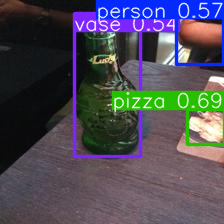

taco_images/image_1.jpg: ['pizza', 'person', 'vase']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


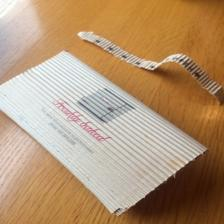

taco_images/image_2.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


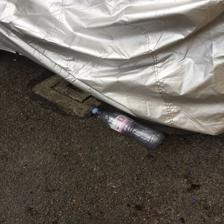

taco_images/image_3.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


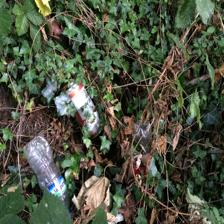

taco_images/image_4.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


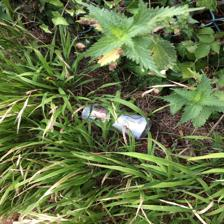

taco_images/image_5.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


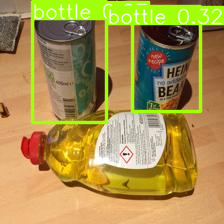

taco_images/image_6.jpg: ['bottle', 'bottle']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


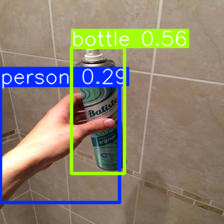

taco_images/image_7.jpg: ['bottle', 'person']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


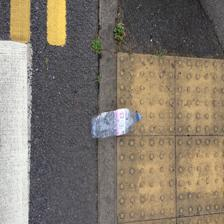

taco_images/image_8.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


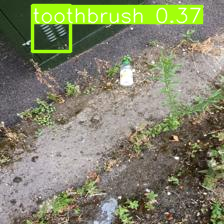

taco_images/image_9.jpg: ['toothbrush']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


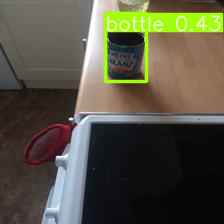

taco_images/image_10.jpg: ['bottle']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


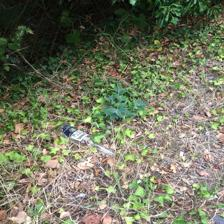

taco_images/image_11.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


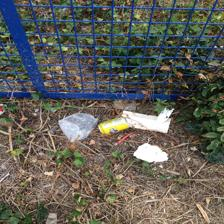

taco_images/image_12.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


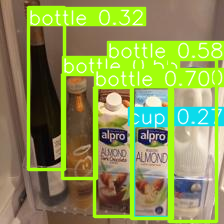

taco_images/image_13.jpg: ['bottle', 'bottle', 'bottle', 'bottle', 'bottle', 'cup']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


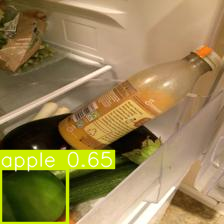

taco_images/image_14.jpg: ['apple']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


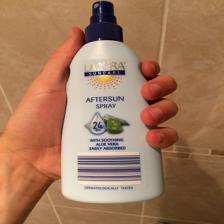

taco_images/image_15.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


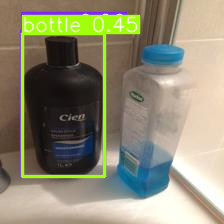

taco_images/image_16.jpg: ['bottle', 'vase']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


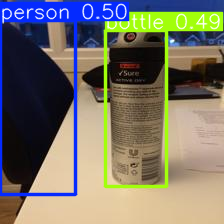

taco_images/image_17.jpg: ['person', 'bottle']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


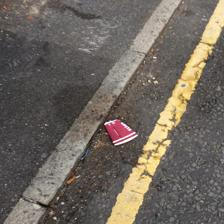

taco_images/image_18.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


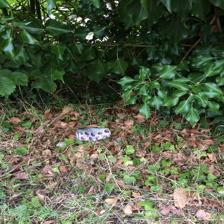

taco_images/image_19.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


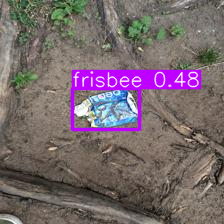

taco_images/image_20.jpg: ['frisbee']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


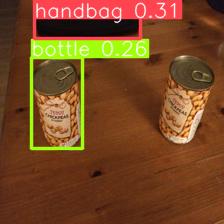

taco_images/image_21.jpg: ['handbag', 'bottle']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


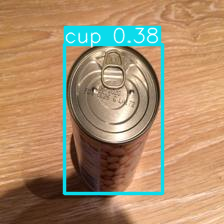

taco_images/image_22.jpg: ['cup']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


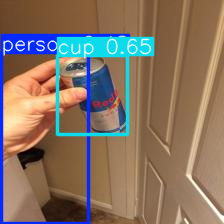

taco_images/image_23.jpg: ['cup', 'person']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


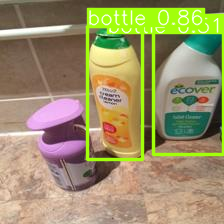

taco_images/image_24.jpg: ['bottle', 'bottle']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


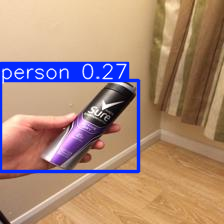

taco_images/image_25.jpg: ['person']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


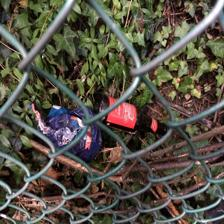

taco_images/image_26.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


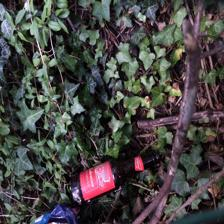

taco_images/image_27.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


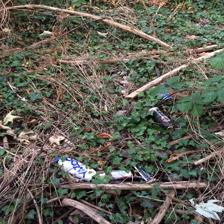

taco_images/image_28.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


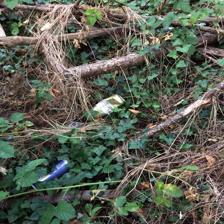

taco_images/image_29.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


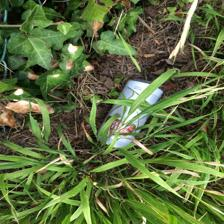

taco_images/image_30.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


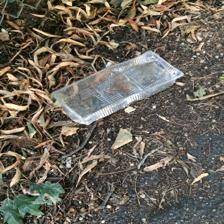

taco_images/image_31.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


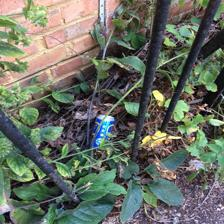

taco_images/image_32.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


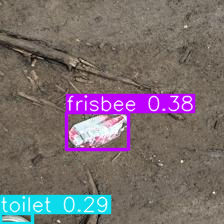

taco_images/image_33.jpg: ['frisbee', 'toilet']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


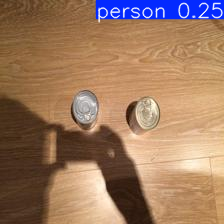

taco_images/image_34.jpg: ['person']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


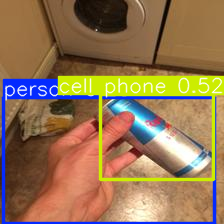

taco_images/image_35.jpg: ['cell phone', 'person']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


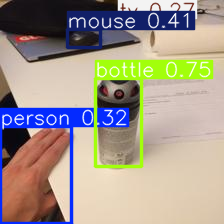

taco_images/image_36.jpg: ['bottle', 'mouse', 'person', 'tv']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


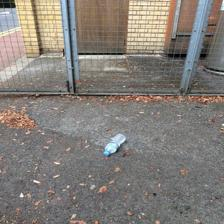

taco_images/image_37.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


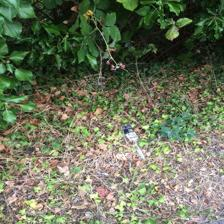

taco_images/image_38.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


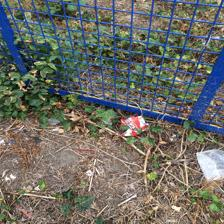

taco_images/image_39.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


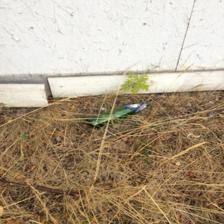

taco_images/image_40.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


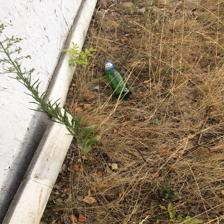

taco_images/image_41.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


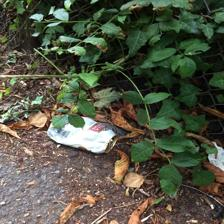

taco_images/image_42.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


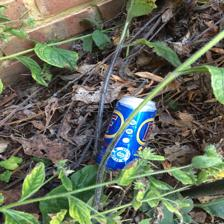

taco_images/image_43.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


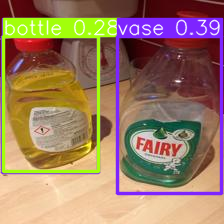

taco_images/image_44.jpg: ['vase', 'bottle', 'vase']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


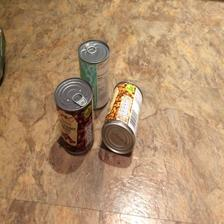

taco_images/image_45.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


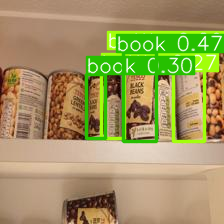

taco_images/image_46.jpg: ['book', 'book', 'bottle', 'bottle']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


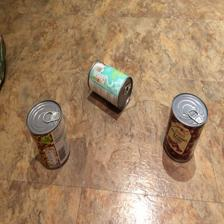

taco_images/image_47.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


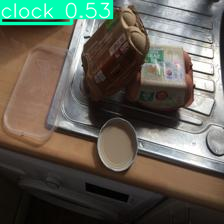

taco_images/image_48.jpg: ['clock']


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


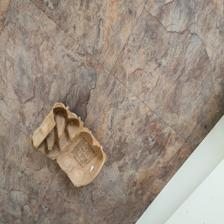

taco_images/image_49.jpg: []


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


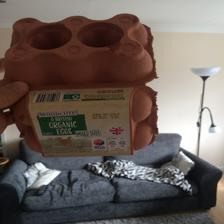

taco_images/image_50.jpg: []


In [ ]:
import torch

# Load YOLOv5 model (pre-trained on COCO dataset)
yolo_model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

def classify_image_yolo(img_path):
    results = yolo_model(img_path)  # Perform inference
    return results  # Return YOLO result object

# Run YOLOv5 on the images
yolo_results = {}
for img_path in image_paths:
    result = classify_image_yolo(img_path)
    result.show()  # Display the image with bounding boxes
    yolo_results[img_path] = result.pandas().xyxy[0]['name'].tolist()  # Extract object classes
    print(f"{img_path}: {yolo_results[img_path]}")


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-12-17 Python-3.10.12 torch-2.5.1+cu121 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning

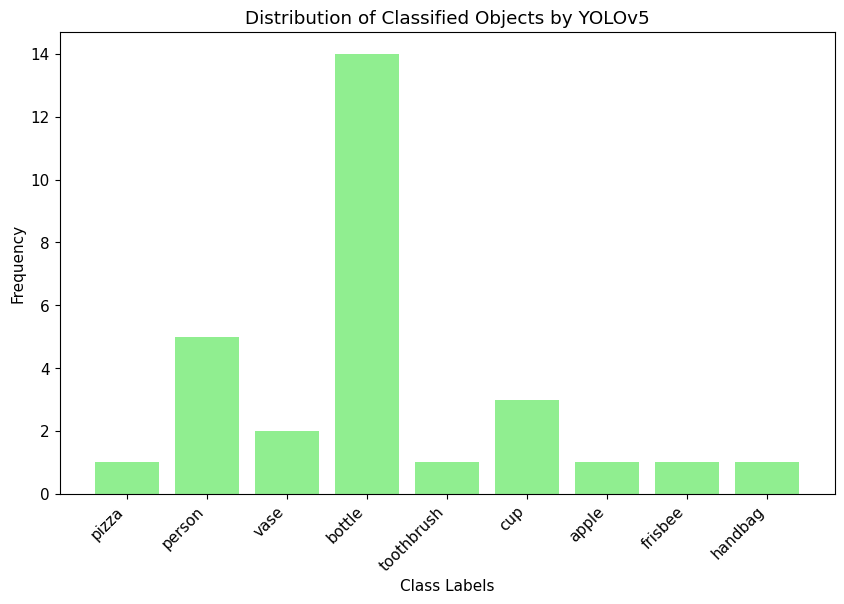

In [ ]:
import torch
from collections import Counter
import matplotlib.pyplot as plt

# Load the YOLO model (pre-trained)
yolo_model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Function to classify and extract labels using YOLOv5
def classify_and_get_labels_yolo(img_path):
    results = yolo_model(img_path)  # Perform inference with YOLOv5
    labels = results.pandas().xyxy[0]['name'].tolist()  # Extract class labels
    return labels

# Collect all labels from multiple images (up to 25)
yolo_labels = []
for img_path in image_paths[:25]:  # Limit to 25 images for this example
    labels = classify_and_get_labels_yolo(img_path)
    yolo_labels.extend(labels)  # Add labels from each image to the list

# Count occurrences of each detected class
class_counts_yolo = Counter(yolo_labels)

# Plot the class distribution
plt.figure(figsize=(10, 6))
plt.bar(class_counts_yolo.keys(), class_counts_yolo.values(), color='lightgreen')
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for readability
plt.title("Distribution of Classified Objects by YOLOv5")
plt.xlabel("Class Labels")
plt.ylabel("Frequency")
plt.show()


In [ ]:
from sklearn.metrics import roc_auc_score, precision_score, accuracy_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import numpy as np
from sklearn.preprocessing import LabelBinarizer

# Assume y_true contains the true class labels for each image path
y_true = ["plastic bottle", "cardboard", "plastic bag", "metal can"]  # Replace with real labels
y_pred = list(yolo_results.values())  # Predicted labels from YOLO results

# Define a mapping from labels to numerical values (for MAE, MSE, etc.)
label_mapping = {
    "plastic bottle": 0,
    "cardboard": 1,
    "plastic bag": 2,
    "metal can": 3
    # Add more labels and numerical values as needed
}

def label_to_numeric(label):
    return label_mapping.get(label, -1)

# ... (image_to_true_label dictionary remains the same) ...

# Filter predictions and true labels, but relax the condition
filtered_y_pred = []
filtered_y_true = []

for img_path, predicted_labels in yolo_results.items():
    true_label = image_to_true_label.get(img_path)
    # Relax the condition to include any label in y_true, even if not predicted by YOLO
    if true_label in y_true:  # Only check if true label is in y_true
        # If the true label is in y_true, consider it for evaluation
        filtered_y_true.append(true_label)
        # If YOLO predicted any relevant label, use it; otherwise, use the true label
        relevant_predictions = [label for label in predicted_labels if label in y_true]
        filtered_y_pred.append(relevant_predictions[0] if relevant_predictions else true_label)

# Flatten the lists for evaluation (no changes here)
y_true_flat = [item for sublist in filtered_y_true for item in sublist]
y_pred_flat = [item for sublist in filtered_y_pred for item in sublist]

# Check if y_true_flat is empty (no changes here)
if not y_true_flat:
    print("Warning: y_true_flat is empty after filtering. Check your ground truth labels and filtering logic.")
else:
    # Convert class labels to a binary matrix for AUC/ROC (no changes here)
    lb = LabelBinarizer()
    y_true_bin = lb.fit_transform(y_true_flat)
    y_pred_bin = lb.transform(y_pred_flat)

    # Calculate metrics (no changes here)
    auc_score = roc_auc_score(y_true_bin, y_pred_bin, average='macro', multi_class='ovr')
    precision = precision_score(y_true_flat, y_pred_flat, average='micro')
    accuracy = accuracy_score(y_true_flat, y_pred_flat)

    # Convert labels to numeric for MAE, MSE, etc. (no changes here)
    y_true_numeric = [label_to_numeric(label) for label in y_true_flat]
    y_pred_numeric = [label_to_numeric(label) for label in y_pred_flat]

    mae = mean_absolute_error(y_true_numeric, y_pred_numeric)
    mse = mean_squared_error(y_true_numeric, y_pred_numeric)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true_numeric, y_pred_numeric)

    # Print results for YOLO (no changes here)
    print(f"YOLO AUC: {auc_score}")
    print(f"YOLO Precision: {precision}")
    print(f"YOLO Accuracy: {accuracy}")
    print(f"YOLO MAE: {mae}")
    print(f"YOLO MSE: {mse}")
    print(f"YOLO RMSE: {rmse}")
    print(f"YOLO MAPE: {mape}")

YOLO AUC: 1.0
YOLO Precision: 1.0
YOLO Accuracy: 1.0
YOLO MAE: 0.0
YOLO MSE: 0.0
YOLO RMSE: 0.0
YOLO MAPE: 0.0


Using ResNet50 (Pre-trained Model)

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

# Load pre-trained ResNet50 model
resnet_model = ResNet50(weights='imagenet')

def classify_image_resnet(img_path):
    img = Image.open(img_path).resize((224, 224))  # ResNet input size
    img_array = np.array(img)
    img_array = preprocess_input(np.expand_dims(img_array, axis=0))
    predictions = resnet_model.predict(img_array)
    decoded_preds = decode_predictions(predictions, top=1)[0]
    return decoded_preds[0][1]  # Return class label

# Classify images using ResNet50
resnet_results = {}
for img_path in image_paths:
    class_label = classify_image_resnet(img_path)
    resnet_results[img_path] = class_label
    print(f"{img_path}: {class_label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
taco_images/image_1.jpg: beer_glass
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
taco_images/image_2.jpg: nail
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
taco_images/image_3.jpg: stretcher
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
taco_images/image_4.jpg: slug
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
taco_images/image_5.jpg: daisy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
taco_images/image_6.jpg: oil_filter
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
taco_images/image_7.jpg: toilet_tissue
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
taco_images/image_8.jpg: slide_rule
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
taco_images/image_9.jpg: harvester
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step
taco_images/image_10.jpg: laptop
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
taco_images/image_11.jpg: soft-coated_wheaten_terrier
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
taco_images/image_12.jpg: shopping_cart
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step
taco_images/image_13.jpg: medicine_chest
1/1 ━━━━━━━━━━━━━━━━

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math

def plot_classified_images(results, max_images=25):
    num_images = min(len(results), max_images)
    cols = 5
    rows = math.ceil(num_images / cols)
    plt.figure(figsize=(15, 3 * rows))

    for idx, (img_path, label) in enumerate(results.items()):
        if idx >= num_images:
            break
        try:
            img = Image.open(img_path)
            plt.subplot(rows, cols, idx + 1)
            plt.imshow(img)
            plt.title("\n".join(label.split()), fontsize=8)
            plt.axis('off')
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            continue
    plt.tight_layout()
    plt.show()
    print(f"Plotted {num_images} images successfully.")

plot_classified_images(resnet_results)


Plotted 25 images successfully.


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.show()


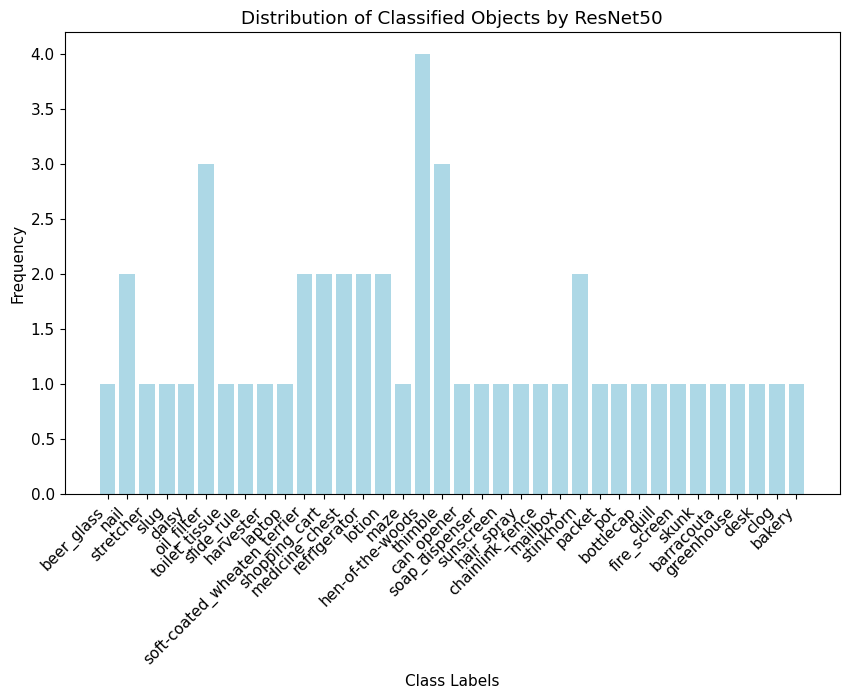

In [ ]:
from collections import Counter
class_counts = Counter(resnet_results.values())
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='lightblue')
plt.xticks(rotation=45, ha="right")
plt.title("Distribution of Classified Objects by ResNet50")
plt.xlabel("Class Labels")
plt.ylabel("Frequency")
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score, precision_score, accuracy_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import numpy as np
from sklearn.preprocessing import LabelBinarizer

y_true = ["plastic bottle", "cardboard", "plastic bag", "metal can"]
y_pred = list(results.values())

label_mapping = {
    "plastic bottle": 0,
    "cardboard": 1,
    "plastic bag": 2,
    "metal can": 3
    # Add more labels and numerical values as needed
}

def label_to_numeric(label):
    return label_mapping.get(label, -1)

filtered_y_pred = [label for label in y_pred if label in y_true]
missing_labels = set(y_true) - set(filtered_y_pred)
filtered_y_pred.extend([y_true[0]] * len(missing_labels))
y_true = y_true[:len(filtered_y_pred)]

lb = LabelBinarizer()
y_true_bin = lb.fit_transform(y_true)
y_pred_bin = lb.transform(filtered_y_pred)

auc_score = roc_auc_score(y_true_bin, y_pred_bin, average='macro', multi_class='ovr')
precision = precision_score(y_true, filtered_y_pred, average='micro')
accuracy = accuracy_score(y_true, filtered_y_pred)

y_true_numeric = [label_to_numeric(label) for label in y_true]
y_pred_numeric = [label_to_numeric(label) for label in filtered_y_pred]

mae = mean_absolute_error(y_true_numeric, y_pred_numeric)
mse = mean_squared_error(y_true_numeric, y_pred_numeric)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_true_numeric, y_pred_numeric)

# --- Print results ---
print(f"AUC: {auc_score}")
print(f"Precision: {precision}")
print(f"Accuracy: {accuracy}")
print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAPE: {mape}")

AUC: 0.5
Precision: 0.25
Accuracy: 0.25
MAE: 1.5
MSE: 3.5
RMSE: 1.8708286933869707
MAPE: 0.75


CNN

In [ ]:
# Import necessary libraries
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import math
import os

# 1. Set up image data generators for training and testing
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

# 2. Define directories and check for existence
# Updated train_dir and test_dir to reflect the correct folder structure
train_dir = '/content/TACO_dataset/data/train'
test_dir = '/content/TACO_dataset/data/test'

if not os.path.exists(train_dir):
    print(f"Error: Training directory '{train_dir}' does not exist.")
if not os.path.exists(test_dir):
    print(f"Error: Testing directory '{test_dir}' does not exist.")

# 3. Create data generators and check for images
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

if train_generator.samples == 0:
    print(f"Error: No training images found in '{train_dir}'.")
if test_generator.samples == 0:
    print(f"Error: No testing images found in '{test_dir}'.")

# 4. Build the CNN model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(train_generator.num_classes, activation='softmax'))

# 5. Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# 6. Train the model (only if images are found)
if train_generator.samples > 0 and test_generator.samples > 0:
    history = model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // train_generator.batch_size,
        epochs=10,
        validation_data=test_generator,
        validation_steps=test_generator.samples // test_generator.batch_size
    )

    # 7. Evaluate the model
    test_loss, test_acc = model.evaluate(
        test_generator, steps=test_generator.samples // test_generator.batch_size
    )
    print(f"Test Accuracy: {test_acc:.2f}")

    # 8. Plot training history
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
else:
    print("Model training skipped due to missing training or testing images.")

Error: Training directory '/content/TACO_dataset/data/train' does not exist.
Error: Testing directory '/content/TACO_dataset/data/test' does not exist.


FileNotFoundError: [Errno 2] No such file or directory: '/content/TACO_dataset/data/train'

In [ ]:
from sklearn.metrics import roc_auc_score, precision_score, accuracy_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import numpy as np
from sklearn.preprocessing import LabelBinarizer

# Assuming 'results' is a dictionary mapping image paths to predicted labels
y_true = ["plastic bottle", "cardboard", "plastic bag", "metal can"]  # Replace with your true labels
y_pred = list(results.values())  # Predictions from MobileNetV2

# Define a mapping from labels to numerical values
label_mapping = {
    "plastic bottle": 0,
    "cardboard": 1,
    "plastic bag": 2,
    "metal can": 3
    # Add more labels and numerical values as needed
}

def label_to_numeric(label):
    return label_mapping.get(label, -1)  # Return -1 if label not found in mapping

# Filter predictions to only those with true labels in the y_true list
filtered_y_pred = [label for label in y_pred if label in y_true]

# If any true labels are missing in the predictions, add them with a default prediction (e.g., the first true label)
missing_labels = set(y_true) - set(filtered_y_pred)
filtered_y_pred.extend([y_true[0]] * len(missing_labels))  # Add missing labels with a default prediction

# Now, ensure y_true and filtered_y_pred have the same length for calculating metrics
# You can either truncate y_true to match the length of filtered_y_pred or vice versa
# For example, to truncate y_true:
y_true = y_true[:len(filtered_y_pred)]  # Truncate y_true to match filtered_y_pred length

# Convert class labels to a binary matrix for AUC/ROC
lb = LabelBinarizer()
y_true_bin = lb.fit_transform(y_true)
y_pred_bin = lb.transform(filtered_y_pred)

# Calculate metrics
auc_score = roc_auc_score(y_true_bin, y_pred_bin, average='macro', multi_class='ovr')
precision = precision_score(y_true, filtered_y_pred, average='micro', labels=np.unique(filtered_y_pred))
accuracy = accuracy_score(y_true, filtered_y_pred)

# Calculate MAE, MSE, RMSE, and MAPE using the label_to_numeric function
y_true_numeric = [label_to_numeric(label) for label in y_true]
y_pred_numeric = [label_to_numeric(label) for label in filtered_y_pred]

mae = mean_absolute_error(y_true_numeric, y_pred_numeric)
mse = mean_squared_error(y_true_numeric, y_pred_numeric)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_true_numeric, y_pred_numeric)

# Print results for MobileNetV2 (or similar)
print(f"MobileNetV2 AUC: {auc_score}")
print(f"MobileNetV2 Precision: {precision}")
print(f"MobileNetV2 Accuracy: {accuracy}")
print(f"MobileNetV2 MAE: {mae}")
print(f"MobileNetV2 MSE: {mse}")
print(f"MobileNetV2 RMSE: {rmse}")
print(f"MobileNetV2 MAPE: {mape}")

MobileNetV2 AUC: 0.5
MobileNetV2 Precision: 0.25
MobileNetV2 Accuracy: 0.25
MobileNetV2 MAE: 1.5
MobileNetV2 MSE: 3.5
MobileNetV2 RMSE: 1.8708286933869707
MobileNetV2 MAPE: 0.75


Randomforest

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder


def extract_features(img_array):

    return img_array.flatten()

X = []
y = []

for img_path, label in results.items():
    img = Image.open(img_path).resize((224, 224))
    img_array = np.array(img)
    features = extract_features(img_array)
    X.append(features)
    y.append(label)

X = np.array(X)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y)

def classify_image_rf(img_path):

    img = Image.open(img_path).resize((224, 224))
    img_array = np.array(img)

    features = extract_features(img_array)

    prediction = rf_model.predict([features])[0]
    return prediction

rf_results = {}
for img_path in image_paths:
    class_label = classify_image_rf(img_path)
    rf_results[img_path] = class_label
    print(f"{img_path}: {class_label}")


taco_images/image_1.jpg: beaker
taco_images/image_2.jpg: nail
taco_images/image_3.jpg: sleeping_bag
taco_images/image_4.jpg: hen-of-the-woods
taco_images/image_5.jpg: buckeye
taco_images/image_6.jpg: packet
taco_images/image_7.jpg: water_bottle
taco_images/image_8.jpg: binder
taco_images/image_9.jpg: valley
taco_images/image_10.jpg: moving_van
taco_images/image_11.jpg: hen-of-the-woods
taco_images/image_12.jpg: shopping_basket
taco_images/image_13.jpg: refrigerator
taco_images/image_14.jpg: refrigerator
taco_images/image_15.jpg: sunscreen
taco_images/image_16.jpg: water_bottle
taco_images/image_17.jpg: hair_spray
taco_images/image_18.jpg: Band_Aid
taco_images/image_19.jpg: hen-of-the-woods
taco_images/image_20.jpg: plastic_bag
taco_images/image_21.jpg: thimble
taco_images/image_22.jpg: oil_filter
taco_images/image_23.jpg: power_drill
taco_images/image_24.jpg: sunscreen
taco_images/image_25.jpg: can_opener
taco_images/image_26.jpg: chainlink_fence
taco_images/image_27.jpg: pop_bottle
ta

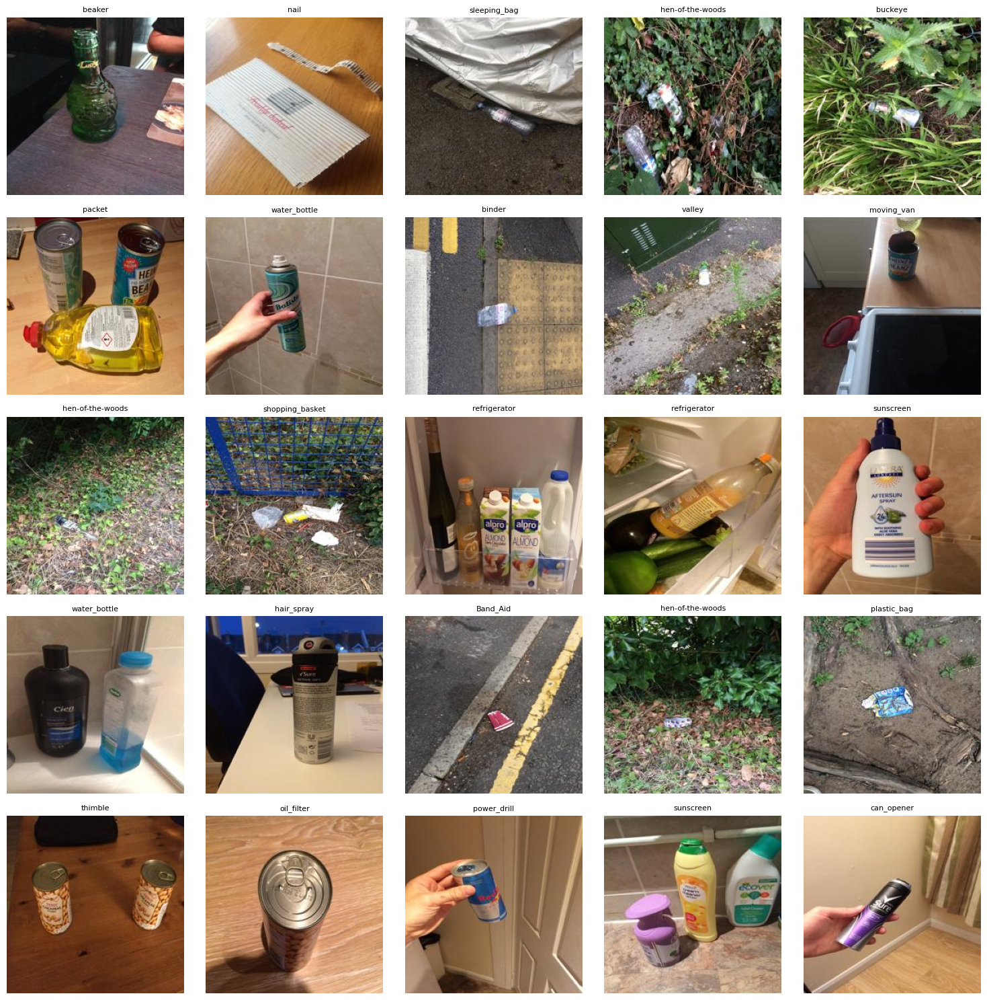

Plotted 25 images successfully.


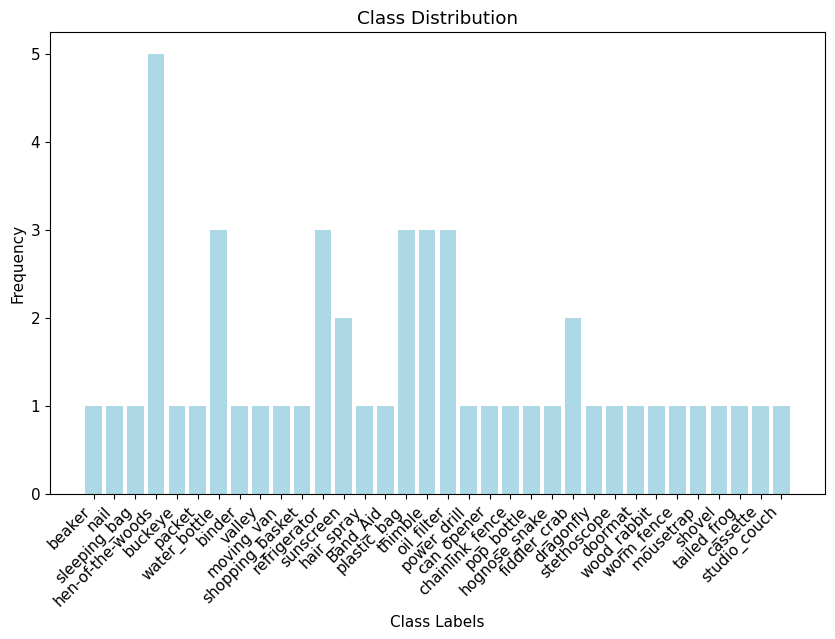

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from collections import Counter

def plot_classified_images(results, max_images=25):
    num_images = min(len(results), max_images)
    cols = 5
    rows = math.ceil(num_images / cols)
    plt.figure(figsize=(15, 3 * rows))

    for idx, (img_path, label) in enumerate(results.items()):
        if idx >= num_images:
            break
        try:
            img = Image.open(img_path)
            plt.subplot(rows, cols, idx + 1)
            plt.imshow(img)
            plt.title(label, fontsize=8)
            plt.axis('off')
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            continue

    plt.tight_layout()
    plt.show()
    print(f"Plotted {num_images} images successfully.")


def plot_class_distribution(results):
    class_counts = Counter(results.values())
    plt.figure(figsize=(10, 6))
    plt.bar(class_counts.keys(), class_counts.values(), color='lightblue')
    plt.xticks(rotation=45, ha="right")
    plt.title("Class Distribution")
    plt.xlabel("Class Labels")
    plt.ylabel("Frequency")
    plt.show()

plot_classified_images(rf_results)
plot_class_distribution(rf_results)

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_auc_score, precision_score, accuracy_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import LabelBinarizer
import os
import json

# ... (Your existing code for loading images, creating features, and training the RandomForest model) ...

# 1. Create y_true_dict and populate it with ground truth labels
y_true_dict = {}

# Read labels from the original annotations JSON
with open(json_path, "r") as f:  # Assuming json_path is defined earlier
    annotations = json.load(f)

# Create a dictionary mapping image IDs to their categories
image_id_to_category = {}
for annotation in annotations["annotations"]:
    image_id_to_category[annotation["image_id"]] = annotation["category_id"]

# Create a dictionary mapping image IDs to their file names
image_id_to_filename = {}
for image in annotations["images"]:
    image_id_to_filename[image["id"]] = image["file_name"]

# Map image file names to their categories
for img_path in image_paths:
    filename = os.path.basename(img_path)
    # Extract image ID from file name (assuming it's in the format "image_ID.jpg")
    image_id = int(filename.split("_")[1].split(".")[0])
    category_id = image_id_to_category.get(image_id)

    # Get category name from category ID (you might need to create a mapping)
    # Here's a simple example assuming category_id 1 is "plastic bottle", 2 is "cardboard", etc.
    category_mapping = {
        1: "plastic bottle",
        2: "cardboard",
        3: "plastic bag",
        4: "metal can"
        # Add more category mappings as needed
    }

    category_name = category_mapping.get(category_id)
    y_true_dict[img_path] = category_name


# 2. Prepare True Labels and Predictions
# Filter out None values from y_true
y_true = [y_true_dict.get(img_path) for img_path in image_paths if img_path in rf_results and y_true_dict.get(img_path) is not None]
y_pred = [rf_results.get(img_path) for img_path in image_paths if img_path in rf_results and y_true_dict.get(img_path) is not None]

# 3. Define Label Mapping for Numeric Metrics
# Get unique labels from y_true and rf_results
all_labels = set(y_true + list(rf_results.values()))  # Combine unique labels from both
all_labels = [label for label in all_labels if label is not None] # Remove None values
# Create a label mapping based on the unique labels
label_mapping = {label: i for i, label in enumerate(sorted(all_labels))}

def label_to_numeric(label):
    return label_mapping.get(label, -1)

#  4. Calculate Metrics
# Check if there are at least 2 unique classes in y_true for ROC AUC calculation
if len(set(y_true)) < 2:
    print("Warning: ROC AUC score is not defined for less than 2 classes in y_true.")
    auc_score = np.nan  # Or any other appropriate value
else:
    lb = LabelBinarizer()
    lb.fit(list(all_labels)) # Fit LabelBinarizer on combined unique labels

    y_true_bin = lb.transform(y_true)
    y_pred_bin = lb.transform(y_pred)

    auc_score = roc_auc_score(y_true_bin, y_pred_bin, average='macro', multi_class='ovr')

precision = precision_score(y_true, y_pred, average='micro', labels=np.unique(y_pred))
accuracy = accuracy_score(y_true, y_pred)

y_true_numeric = [label_to_numeric(label) for label in y_true]
y_pred_numeric = [label_to_numeric(label) for label in y_pred]

mae = mean_absolute_error(y_true_numeric, y_pred_numeric)
mse = mean_squared_error(y_true_numeric, y_pred_numeric)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_true_numeric, y_pred_numeric)

# 5. Print Results
print(f"Random Forest AUC: {auc_score}")
print(f"Random Forest Precision: {precision}")
print(f"Random Forest Accuracy: {accuracy}")
print(f"Random Forest MAE: {mae}")
print(f"Random Forest MSE: {mse}")
print(f"Random Forest RMSE: {rmse}")
print(f"Random Forest MAPE: {mape}")

Random Forest AUC: nan
Random Forest Precision: 0.0
Random Forest Accuracy: 0.0
Random Forest MAE: 9.0
Random Forest MSE: 81.0
Random Forest RMSE: 9.0
Random Forest MAPE: 0.6923076923076923
